retrieve transformer models from Hugging Face (i.e., Megatron GPT-2)

In [1]:
!pip install transformers

In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [3]:
from transformers import GPT2Model, GPT2Config

configuration = GPT2Config(model_type='gpt2-xl')
gpt2 = GPT2Model(configuration)
configuration = gpt2.config


In [4]:
gpt2

GPT2Model(
  (wte): Embedding(50257, 768)
  (wpe): Embedding(1024, 768)
  (drop): Dropout(p=0.1, inplace=False)
  (h): ModuleList(
    (0): GPT2Block(
      (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (attn): GPT2Attention(
        (c_attn): Conv1D()
        (c_proj): Conv1D()
        (attn_dropout): Dropout(p=0.1, inplace=False)
        (resid_dropout): Dropout(p=0.1, inplace=False)
      )
      (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (mlp): GPT2MLP(
        (c_fc): Conv1D()
        (c_proj): Conv1D()
        (dropout): Dropout(p=0.1, inplace=False)
      )
    )
    (1): GPT2Block(
      (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (attn): GPT2Attention(
        (c_attn): Conv1D()
        (c_proj): Conv1D()
        (attn_dropout): Dropout(p=0.1, inplace=False)
        (resid_dropout): Dropout(p=0.1, inplace=False)
      )
      (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (mlp): GPT2MLP

In [5]:
for i in range(12):  # GPT-2 has 12 blocks
    locals()["block_" + str(i) + "_attn_c_attn"] = gpt2.h[i].attn.c_attn.weight[:].detach().numpy()
    locals()["block_" + str(i) + "_attn_c_proj"] = gpt2.h[i].attn.c_proj.weight[:].detach().numpy()
    locals()["block_" + str(i) + "_mlp_c_fc"] = gpt2.h[i].mlp.c_fc.weight[:].detach().numpy()
    locals()["block_" + str(i) + "_mlp_c_proj"] = gpt2.h[i].mlp.c_proj.weight[:].detach().numpy()

In [13]:
for i in range(12):  # GPT-2 has 12 blocks
    print("GPT block {} _attn_c_attn".format(i), locals()["block_" + str(i) + "_attn_c_attn"].shape)
    print("GPT block {} _attn_c_proj".format(i), locals()["block_" + str(i) + "_attn_c_proj"].shape)
    print("GPT block {} _mlp_c_fc".format(i), locals()["block_" + str(i) + "_mlp_c_fc"].shape)
    print("GPT block {} _mlp_c_proj".format(i), locals()["block_" + str(i) + "_mlp_c_proj"].shape)


GPT block 0 _attn_c_attn (768, 2304)
GPT block 0 _attn_c_proj (768, 768)
GPT block 0 _mlp_c_fc (768, 3072)
GPT block 0 _mlp_c_proj (3072, 768)
GPT block 1 _attn_c_attn (768, 2304)
GPT block 1 _attn_c_proj (768, 768)
GPT block 1 _mlp_c_fc (768, 3072)
GPT block 1 _mlp_c_proj (3072, 768)
GPT block 2 _attn_c_attn (768, 2304)
GPT block 2 _attn_c_proj (768, 768)
GPT block 2 _mlp_c_fc (768, 3072)
GPT block 2 _mlp_c_proj (3072, 768)
GPT block 3 _attn_c_attn (768, 2304)
GPT block 3 _attn_c_proj (768, 768)
GPT block 3 _mlp_c_fc (768, 3072)
GPT block 3 _mlp_c_proj (3072, 768)
GPT block 4 _attn_c_attn (768, 2304)
GPT block 4 _attn_c_proj (768, 768)
GPT block 4 _mlp_c_fc (768, 3072)
GPT block 4 _mlp_c_proj (3072, 768)
GPT block 5 _attn_c_attn (768, 2304)
GPT block 5 _attn_c_proj (768, 768)
GPT block 5 _mlp_c_fc (768, 3072)
GPT block 5 _mlp_c_proj (3072, 768)
GPT block 6 _attn_c_attn (768, 2304)
GPT block 6 _attn_c_proj (768, 768)
GPT block 6 _mlp_c_fc (768, 3072)
GPT block 6 _mlp_c_proj (3072, 768)

In [9]:
from analyze_model import Plot2DMatrix, PlotVectorSizes

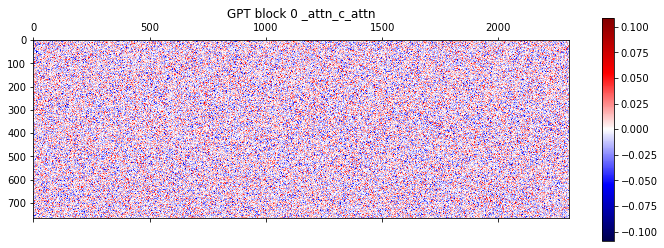

100%|██████████| 768/768 [00:03<00:00, 206.83it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


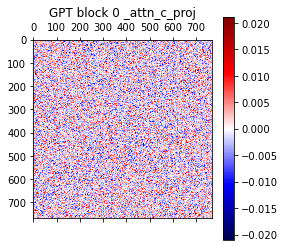

100%|██████████| 768/768 [00:01<00:00, 614.57it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


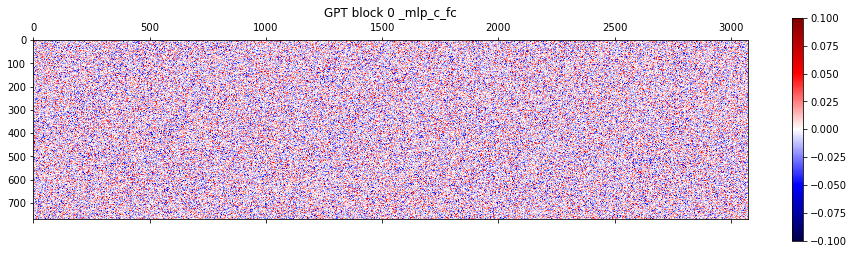

100%|██████████| 768/768 [00:04<00:00, 154.93it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


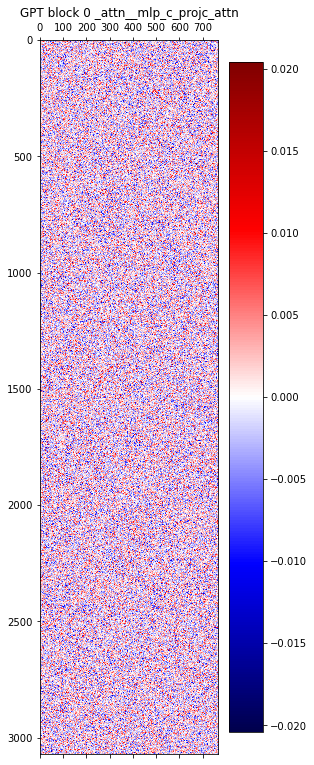

100%|██████████| 3072/3072 [00:04<00:00, 629.42it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


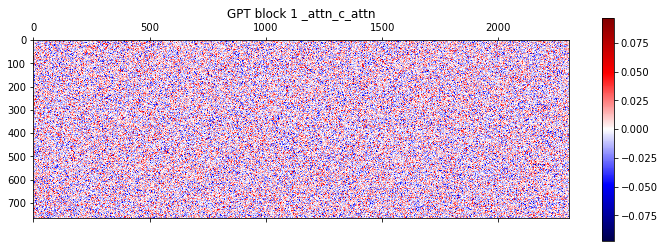

100%|██████████| 768/768 [00:03<00:00, 205.32it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


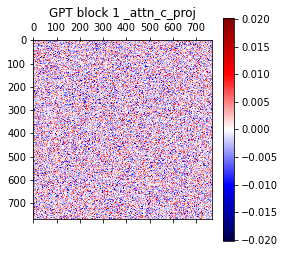

100%|██████████| 768/768 [00:01<00:00, 628.36it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


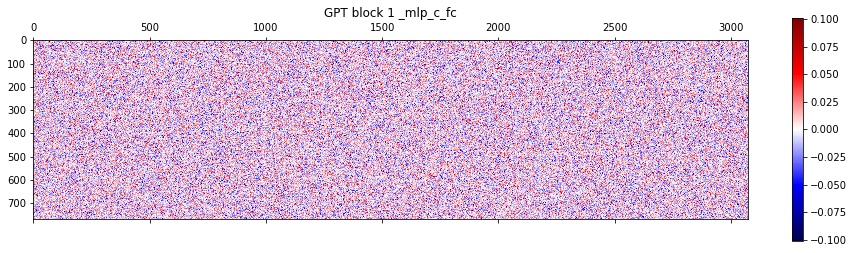

100%|██████████| 768/768 [00:04<00:00, 154.32it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


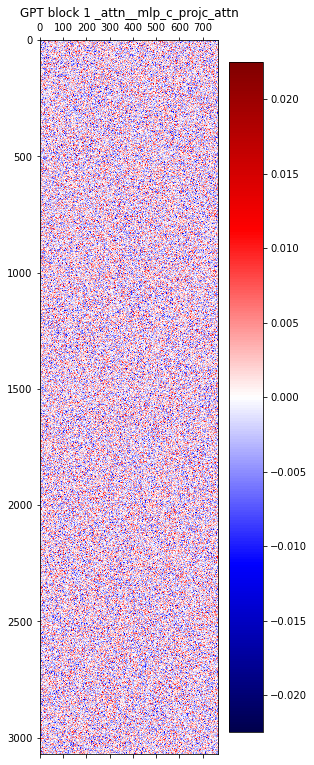

100%|██████████| 3072/3072 [00:04<00:00, 627.67it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


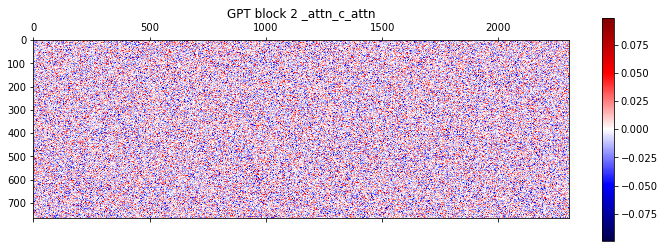

100%|██████████| 768/768 [00:03<00:00, 207.77it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


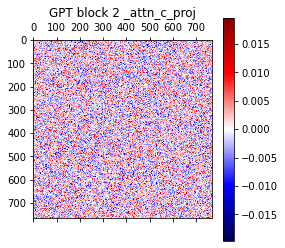

100%|██████████| 768/768 [00:01<00:00, 622.17it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


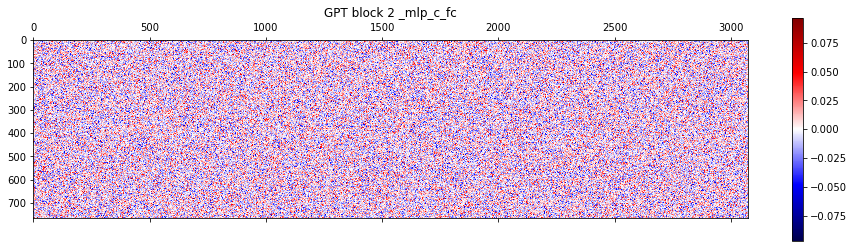

100%|██████████| 768/768 [00:04<00:00, 155.38it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


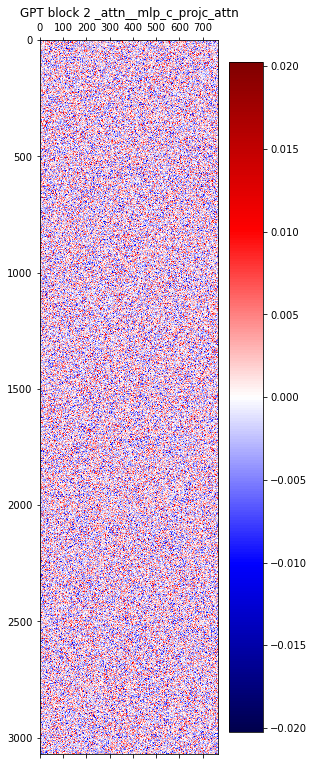

100%|██████████| 3072/3072 [00:04<00:00, 623.59it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


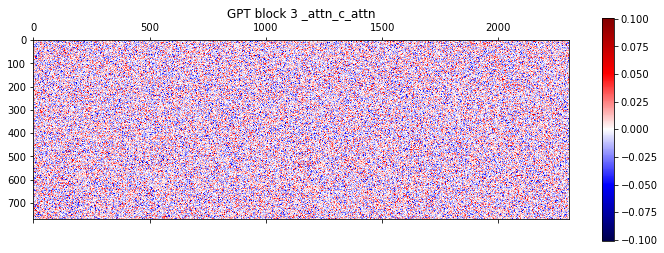

100%|██████████| 768/768 [00:03<00:00, 209.27it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


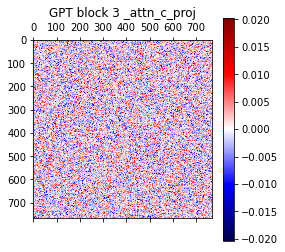

100%|██████████| 768/768 [00:01<00:00, 632.66it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


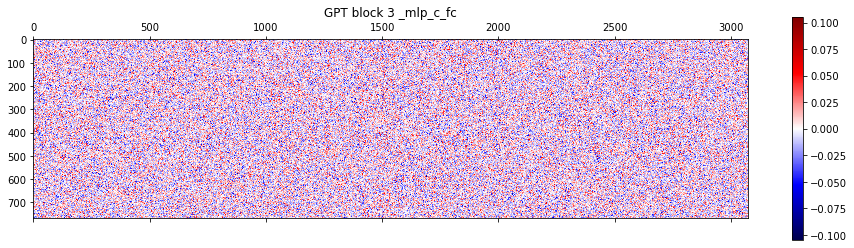

100%|██████████| 768/768 [00:04<00:00, 156.79it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


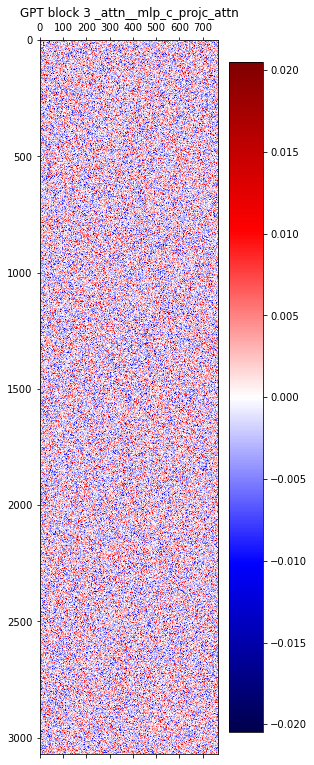

100%|██████████| 3072/3072 [00:04<00:00, 626.06it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


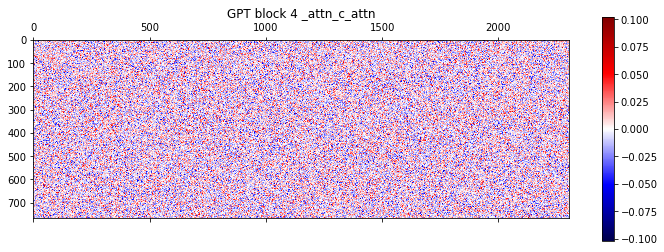

100%|██████████| 768/768 [00:03<00:00, 206.79it/s]


There are totally 1 zero elements in this matrix, percentage is 5.651403356481481e-07


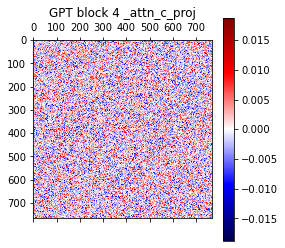

100%|██████████| 768/768 [00:01<00:00, 611.73it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


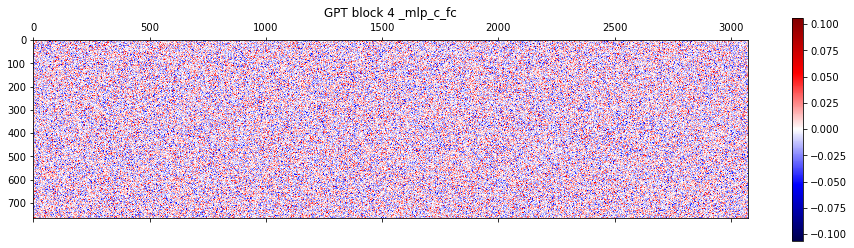

100%|██████████| 768/768 [00:04<00:00, 155.79it/s]


There are totally 2 zero elements in this matrix, percentage is 8.477105034722222e-07


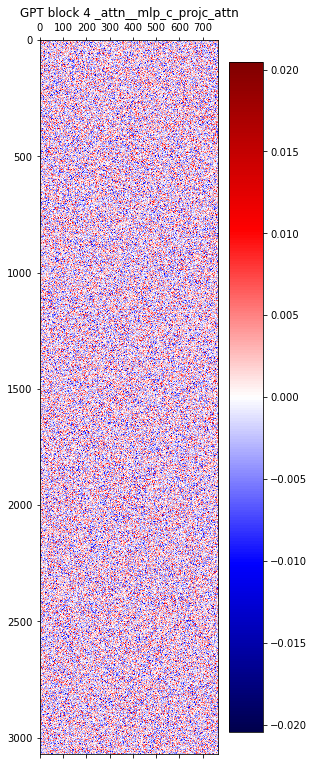

100%|██████████| 3072/3072 [00:04<00:00, 616.54it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


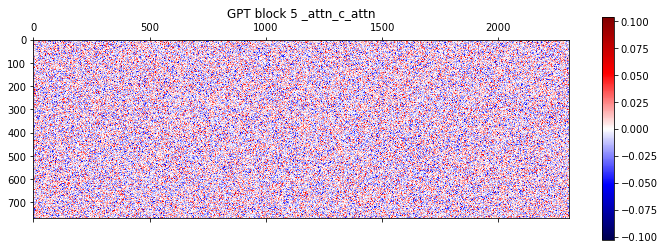

100%|██████████| 768/768 [00:03<00:00, 207.21it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


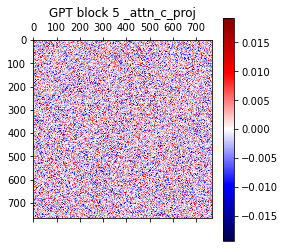

100%|██████████| 768/768 [00:01<00:00, 616.85it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


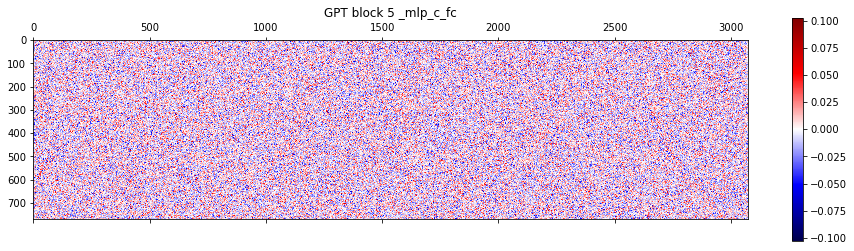

100%|██████████| 768/768 [00:04<00:00, 155.73it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


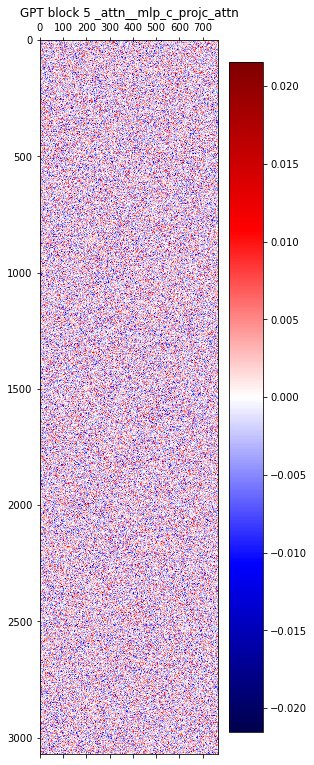

100%|██████████| 3072/3072 [00:04<00:00, 629.02it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


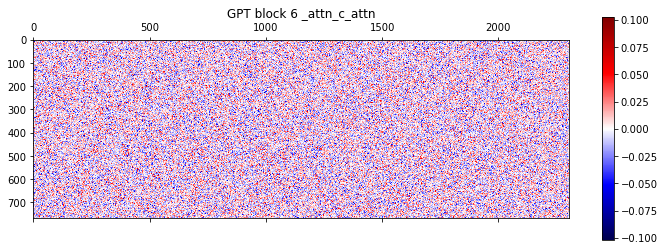

100%|██████████| 768/768 [00:03<00:00, 207.23it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


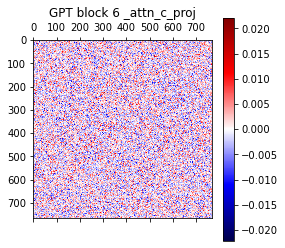

100%|██████████| 768/768 [00:01<00:00, 621.54it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


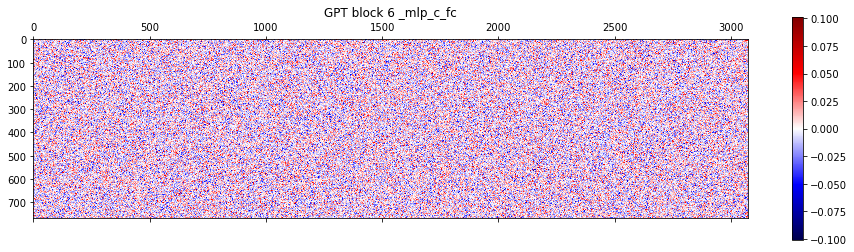

100%|██████████| 768/768 [00:04<00:00, 156.28it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


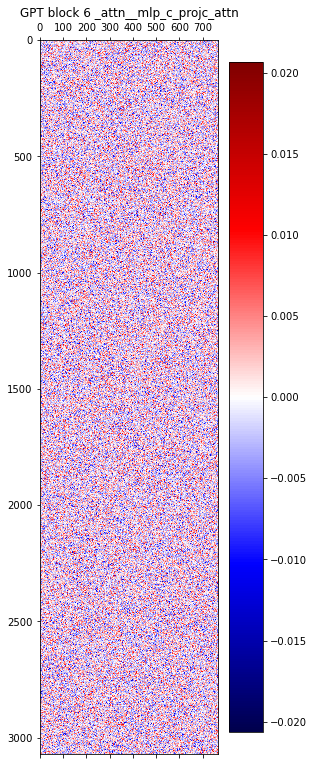

100%|██████████| 3072/3072 [00:04<00:00, 625.15it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


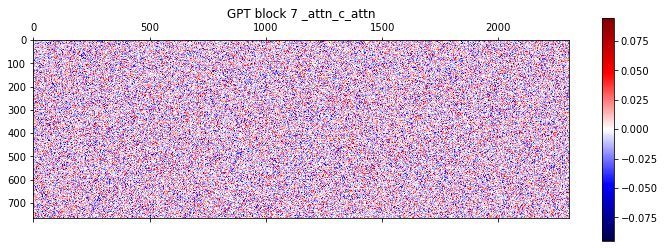

100%|██████████| 768/768 [00:03<00:00, 208.42it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


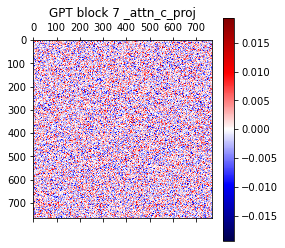

100%|██████████| 768/768 [00:01<00:00, 626.11it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


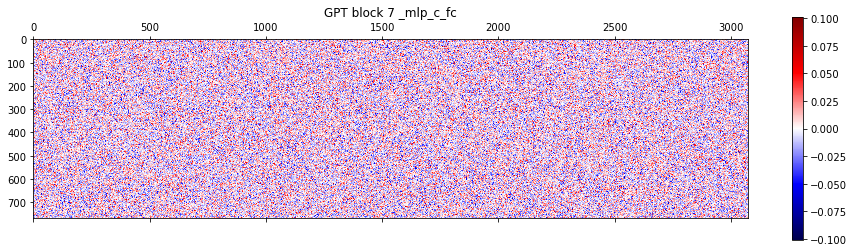

100%|██████████| 768/768 [00:04<00:00, 155.58it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


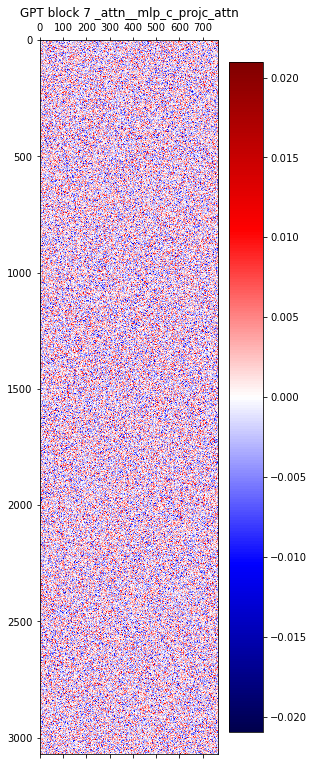

100%|██████████| 3072/3072 [00:04<00:00, 628.10it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


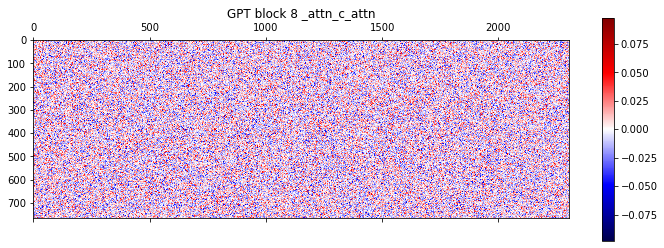

100%|██████████| 768/768 [00:03<00:00, 208.95it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


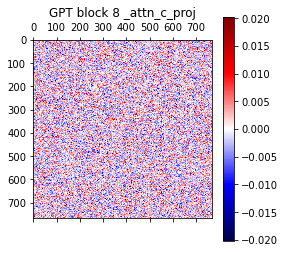

100%|██████████| 768/768 [00:01<00:00, 621.58it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


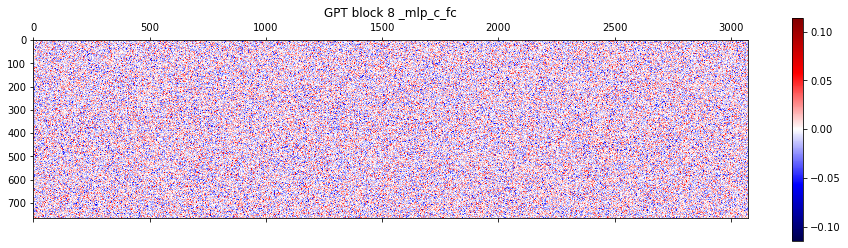

100%|██████████| 768/768 [00:04<00:00, 154.92it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


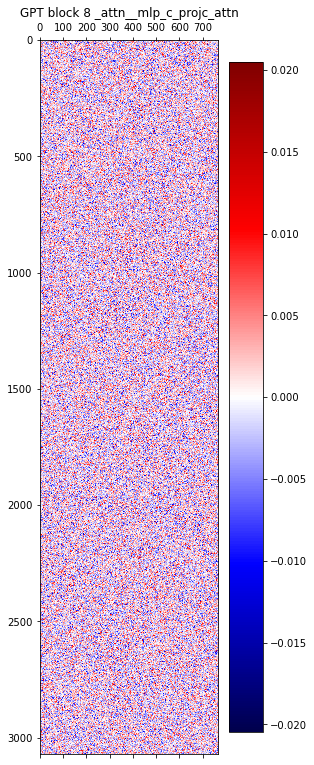

100%|██████████| 3072/3072 [00:04<00:00, 623.67it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


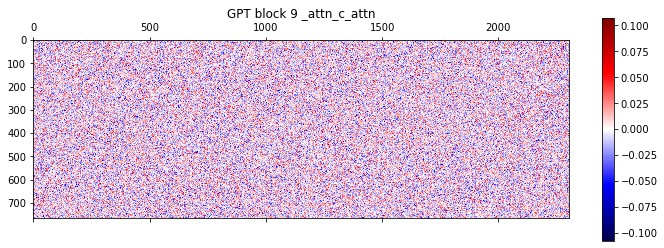

100%|██████████| 768/768 [00:03<00:00, 207.81it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


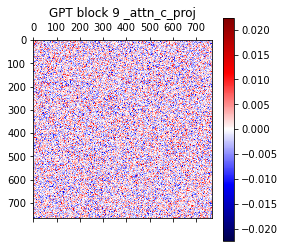

100%|██████████| 768/768 [00:01<00:00, 625.56it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


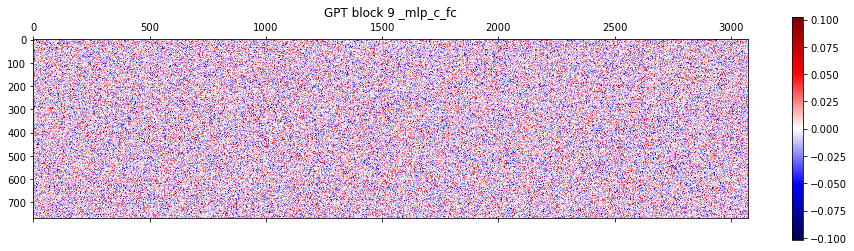

100%|██████████| 768/768 [00:04<00:00, 156.07it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


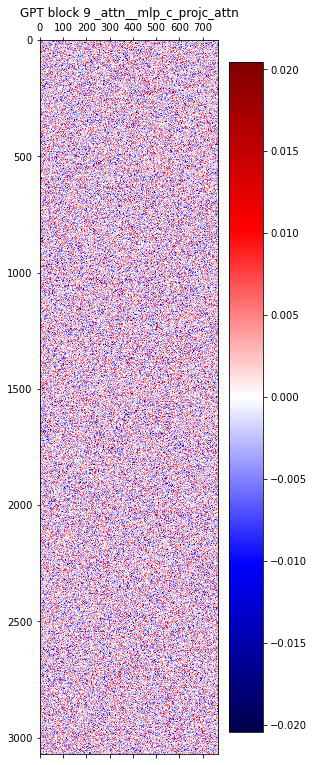

100%|██████████| 3072/3072 [00:04<00:00, 620.67it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


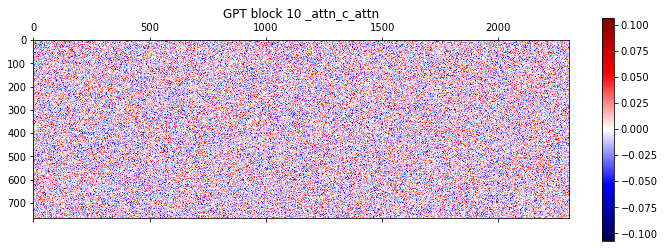

100%|██████████| 768/768 [00:03<00:00, 207.48it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


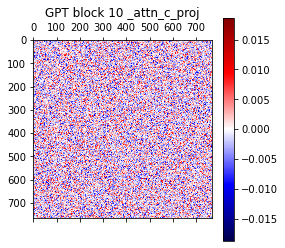

100%|██████████| 768/768 [00:01<00:00, 623.96it/s]


There are totally 1 zero elements in this matrix, percentage is 1.6954210069444444e-06


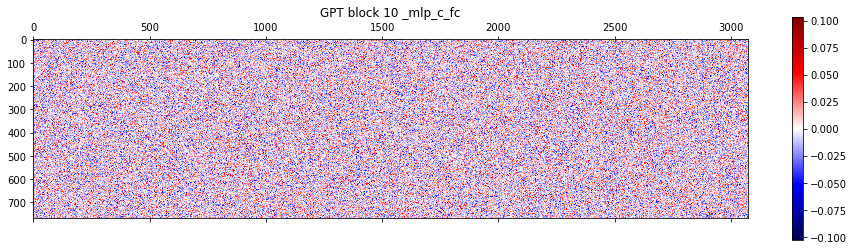

100%|██████████| 768/768 [00:04<00:00, 156.20it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


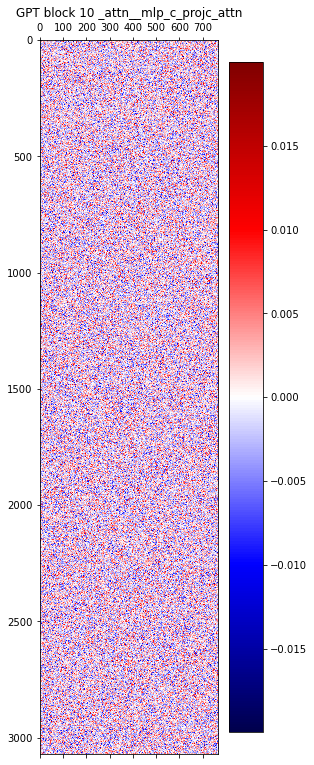

100%|██████████| 3072/3072 [00:04<00:00, 628.56it/s]


There are totally 1 zero elements in this matrix, percentage is 4.238552517361111e-07


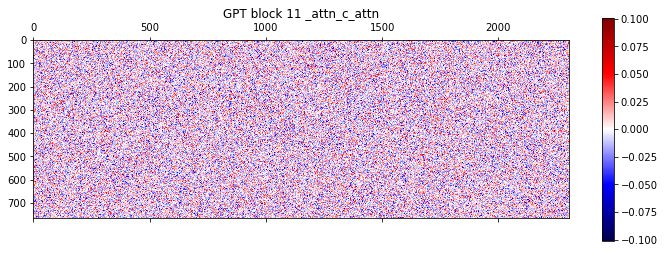

100%|██████████| 768/768 [00:03<00:00, 208.98it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


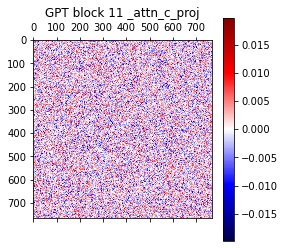

100%|██████████| 768/768 [00:01<00:00, 628.75it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


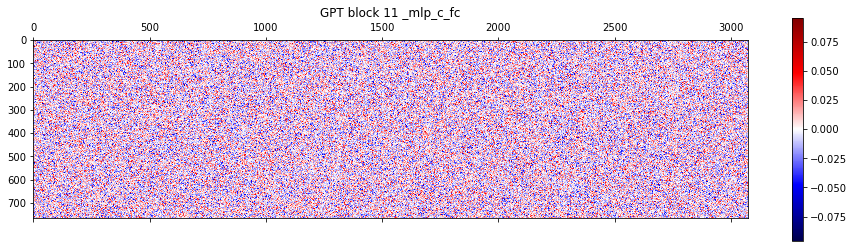

100%|██████████| 768/768 [00:04<00:00, 156.80it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


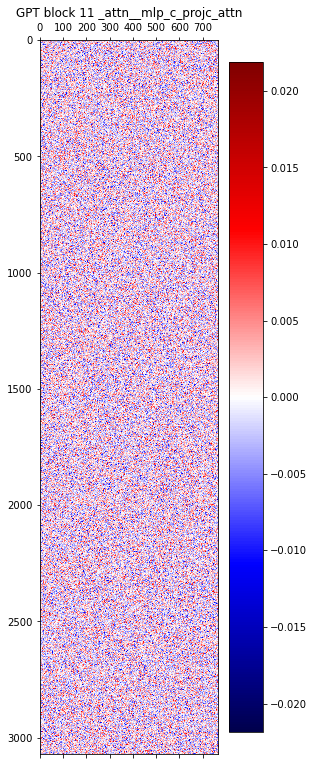

100%|██████████| 3072/3072 [00:04<00:00, 626.66it/s]

There are totally 0 zero elements in this matrix, percentage is 0.0


In [16]:
for i in range(12):  # GPT-2 has 12 blocks
    Plot2DMatrix(locals()["block_" + str(i) + "_attn_c_attn"], "GPT block {} _attn_c_attn".format(i), color_map="seismic")
    Plot2DMatrix(locals()["block_" + str(i) + "_attn_c_proj"], "GPT block {} _attn_c_proj".format(i), color_map="seismic")
    Plot2DMatrix(locals()["block_" + str(i) + "_mlp_c_fc"], "GPT block {} _mlp_c_fc".format(i), color_map="seismic")
    Plot2DMatrix(locals()["block_" + str(i) + "_mlp_c_proj"], "GPT block {} _attn__mlp_c_projc_attn".format(i), color_map="seismic")

In [6]:
import torch.nn.utils.prune as prune

## global pruning
parameters_to_prune = (
    (gpt2.h[0].attn.c_attn, 'weight'),
    (gpt2.h[0].attn.c_proj, 'weight'),
    (gpt2.h[0].mlp.c_fc, 'weight'),
    (gpt2.h[0].mlp.c_proj, 'weight'),
    (gpt2.h[1].attn.c_attn, 'weight'),
    (gpt2.h[1].attn.c_proj, 'weight'),
    (gpt2.h[1].mlp.c_fc, 'weight'),
    (gpt2.h[1].mlp.c_proj, 'weight'),
    (gpt2.h[2].attn.c_attn, 'weight'),
    (gpt2.h[2].attn.c_proj, 'weight'),
    (gpt2.h[2].mlp.c_fc, 'weight'),
    (gpt2.h[2].mlp.c_proj, 'weight'),
    (gpt2.h[3].attn.c_attn, 'weight'),
    (gpt2.h[3].attn.c_proj, 'weight'),
    (gpt2.h[3].mlp.c_fc, 'weight'),
    (gpt2.h[3].mlp.c_proj, 'weight'),
    (gpt2.h[4].attn.c_attn, 'weight'),
    (gpt2.h[4].attn.c_proj, 'weight'),
    (gpt2.h[4].mlp.c_fc, 'weight'),
    (gpt2.h[4].mlp.c_proj, 'weight'),
    (gpt2.h[5].attn.c_attn, 'weight'),
    (gpt2.h[5].attn.c_proj, 'weight'),
    (gpt2.h[5].mlp.c_fc, 'weight'),
    (gpt2.h[5].mlp.c_proj, 'weight'),
    (gpt2.h[6].attn.c_attn, 'weight'),
    (gpt2.h[6].attn.c_proj, 'weight'),
    (gpt2.h[6].mlp.c_fc, 'weight'),
    (gpt2.h[6].mlp.c_proj, 'weight'),
    (gpt2.h[7].attn.c_attn, 'weight'),
    (gpt2.h[7].attn.c_proj, 'weight'),
    (gpt2.h[7].mlp.c_fc, 'weight'),
    (gpt2.h[7].mlp.c_proj, 'weight'),
    (gpt2.h[8].attn.c_attn, 'weight'),
    (gpt2.h[8].attn.c_proj, 'weight'),
    (gpt2.h[8].mlp.c_fc, 'weight'),
    (gpt2.h[8].mlp.c_proj, 'weight'),
    (gpt2.h[9].attn.c_attn, 'weight'),
    (gpt2.h[9].attn.c_proj, 'weight'),
    (gpt2.h[9].mlp.c_fc, 'weight'),
    (gpt2.h[9].mlp.c_proj, 'weight'),
    (gpt2.h[10].attn.c_attn, 'weight'),
    (gpt2.h[10].attn.c_proj, 'weight'),
    (gpt2.h[10].mlp.c_fc, 'weight'),
    (gpt2.h[10].mlp.c_proj, 'weight'),
    (gpt2.h[11].attn.c_attn, 'weight'),
    (gpt2.h[11].attn.c_proj, 'weight'),
    (gpt2.h[11].mlp.c_fc, 'weight'),
    (gpt2.h[11].mlp.c_proj, 'weight'),
)

prune.global_unstructured(
    parameters_to_prune,
    pruning_method=prune.L1Unstructured,
    amount=0.8,
)

for i in range(12):
    print(
        "Sparsity in c_attn.weight: {:.2f}%".format(
            100. * float(torch.sum(gpt2.h[i].attn.c_attn.weight == 0))
            / float(gpt2.h[i].attn.c_attn.weight.nelement())
        )
    )
    print(
        "Sparsity in c_attn.weight: {:.2f}%".format(
            100. * float(torch.sum(gpt2.h[i].attn.c_proj.weight == 0))
            / float(gpt2.h[i].attn.c_proj.weight.nelement())
        )
    )
    print(
        "Sparsity in c_attn.weight: {:.2f}%".format(
            100. * float(torch.sum(gpt2.h[i].mlp.c_fc.weight == 0))
            / float(gpt2.h[i].mlp.c_fc.weight.nelement())
        )
    )
    print(
        "Sparsity in c_attn.weight: {:.2f}%".format(
            100. * float(torch.sum(gpt2.h[i].mlp.c_proj.weight == 0))
            / float(gpt2.h[i].mlp.c_proj.weight.nelement())
        )
    )
    

Sparsity in c_attn.weight: 65.71%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.73%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.71%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.70%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.73%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.67%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.73%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.74%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.73%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.71%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.75%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.72%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.70%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.72%
Sparsity in c_attn.weight: 100.00%
Sparsity in c_attn.weight: 65.71%


In [7]:
for i in range(12):  # GPT-2 has 12 blocks
    locals()["compressed_block_" + str(i) + "_attn_c_attn"] = gpt2.h[i].attn.c_attn.weight[:].detach().numpy()
    locals()["compressed_block_" + str(i) + "_attn_c_proj"] = gpt2.h[i].attn.c_proj.weight[:].detach().numpy()
    locals()["compressed_block_" + str(i) + "_mlp_c_fc"] = gpt2.h[i].mlp.c_fc.weight[:].detach().numpy()
    locals()["compressed_block_" + str(i) + "_mlp_c_proj"] = gpt2.h[i].mlp.c_proj.weight[:].detach().numpy()
    print("GPT block {} _attn_c_attn".format(i), locals()["compressed_block_" + str(i) + "_attn_c_attn"].shape)
    print("GPT block {} _attn_c_proj".format(i), locals()["compressed_block_" + str(i) + "_attn_c_proj"].shape)
    print("GPT block {} _mlp_c_fc".format(i), locals()["compressed_block_" + str(i) + "_mlp_c_fc"].shape)
    print("GPT block {} _mlp_c_proj".format(i), locals()["compressed_block_" + str(i) + "_mlp_c_proj"].shape)

GPT block 0 _attn_c_attn (768, 2304)
GPT block 0 _attn_c_proj (768, 768)
GPT block 0 _mlp_c_fc (768, 3072)
GPT block 0 _mlp_c_proj (3072, 768)
GPT block 1 _attn_c_attn (768, 2304)
GPT block 1 _attn_c_proj (768, 768)
GPT block 1 _mlp_c_fc (768, 3072)
GPT block 1 _mlp_c_proj (3072, 768)
GPT block 2 _attn_c_attn (768, 2304)
GPT block 2 _attn_c_proj (768, 768)
GPT block 2 _mlp_c_fc (768, 3072)
GPT block 2 _mlp_c_proj (3072, 768)
GPT block 3 _attn_c_attn (768, 2304)
GPT block 3 _attn_c_proj (768, 768)
GPT block 3 _mlp_c_fc (768, 3072)
GPT block 3 _mlp_c_proj (3072, 768)
GPT block 4 _attn_c_attn (768, 2304)
GPT block 4 _attn_c_proj (768, 768)
GPT block 4 _mlp_c_fc (768, 3072)
GPT block 4 _mlp_c_proj (3072, 768)
GPT block 5 _attn_c_attn (768, 2304)
GPT block 5 _attn_c_proj (768, 768)
GPT block 5 _mlp_c_fc (768, 3072)
GPT block 5 _mlp_c_proj (3072, 768)
GPT block 6 _attn_c_attn (768, 2304)
GPT block 6 _attn_c_proj (768, 768)
GPT block 6 _mlp_c_fc (768, 3072)
GPT block 6 _mlp_c_proj (3072, 768)

100%|██████████| 768/768 [00:03<00:00, 206.85it/s]
/home/zhizhenz/lightning-master/simulation/models/analyze_model.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(18,3), sharey=False, tight_layout=True)
100%|██████████| 3072/3072 [00:04<00:00, 624.29it/s]


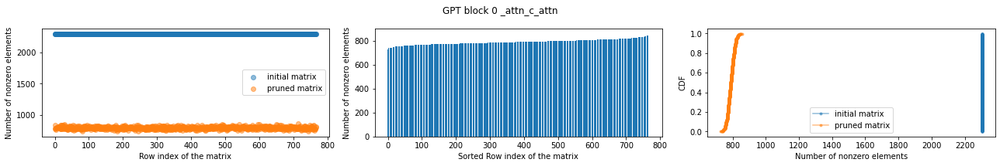

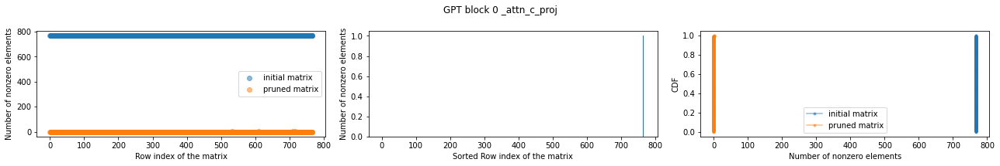

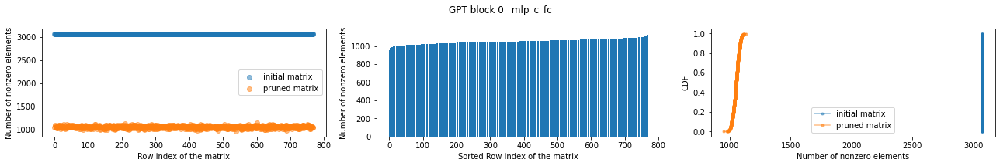

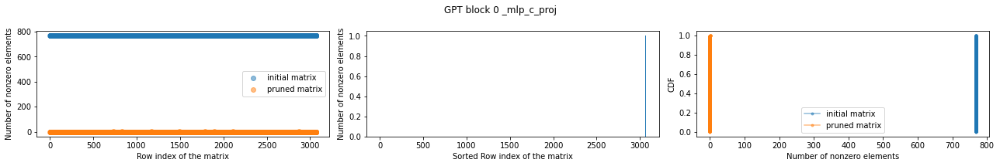

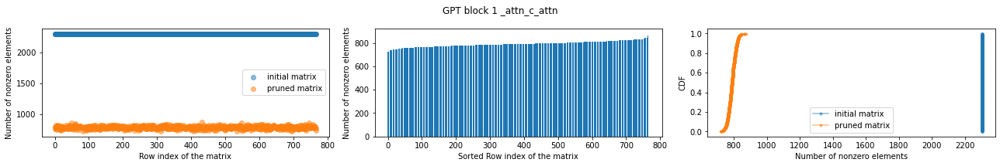

...

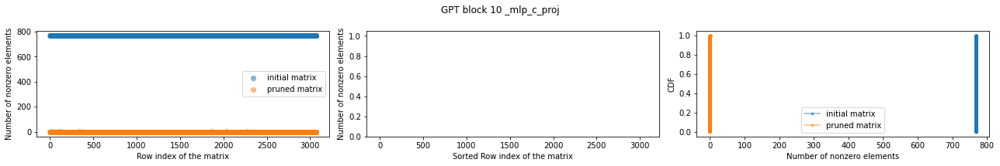

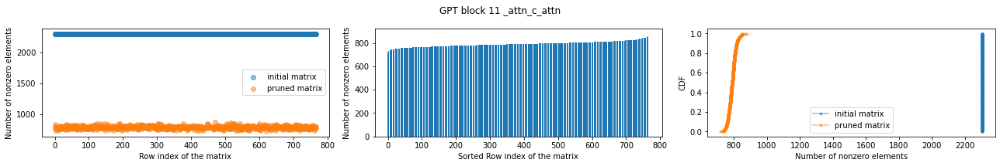

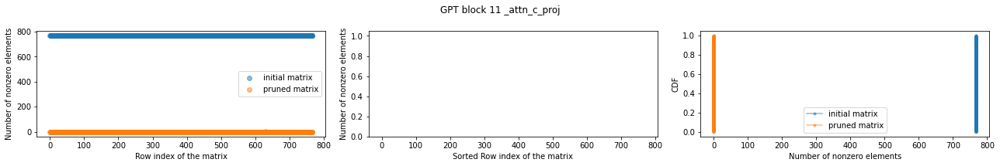

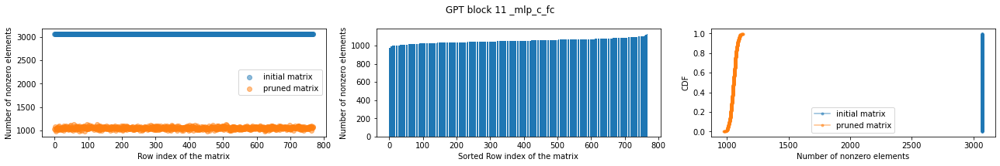

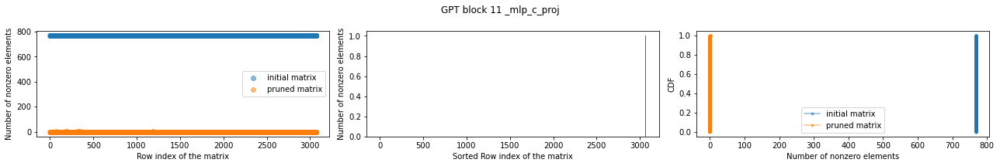

In [10]:
for i in range(12):
    PlotVectorSizes(locals()["block_" + str(i) + "_attn_c_attn"], locals()["compressed_block_" + str(i) + "_attn_c_attn"], "GPT block {} _attn_c_attn".format(i), plot_two_matrces=True)
    PlotVectorSizes(locals()["block_" + str(i) + "_attn_c_proj"], locals()["compressed_block_" + str(i) + "_attn_c_proj"], "GPT block {} _attn_c_proj".format(i), plot_two_matrces=True)
    PlotVectorSizes(locals()["block_" + str(i) + "_mlp_c_fc"], locals()["compressed_block_" + str(i) + "_mlp_c_fc"], "GPT block {} _mlp_c_fc".format(i), plot_two_matrces=True)
    PlotVectorSizes(locals()["block_" + str(i) + "_mlp_c_proj"], locals()["compressed_block_" + str(i) + "_mlp_c_proj"], "GPT block {} _mlp_c_proj".format(i), plot_two_matrces=True)